In [1]:
import os
from os import listdir
import numpy as np
import math
from datetime import datetime, timezone, timedelta
import pytz
import pandas as pd
import xarray as xr
from scipy.spatial.distance import cdist
from scipy.spatial import distance
from sklearn.metrics import mean_squared_error
from scipy import stats
from scipy.stats import mstats

import matplotlib.colors as mcolors
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from matplotlib.animation import ArtistAnimation
from matplotlib.cm import get_cmap
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from metpy.plots import USCOUNTIES
from matplotlib import cm

from scipy.spatial.distance import cdist

from scipy.spatial import distance

import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

import geopandas as gpd
import rioxarray as rxr

local imports

In [2]:
from functions import *
from figure_functions import *

Define path to processed data

In [3]:
# Create a path to the code file
codeDir = os.path.dirname(os.path.abspath(os.getcwd()))
# Create a path to the data folder
data_folder = os.path.join(codeDir,"data","processed")
# Change to data folder
os.chdir(data_folder)

Open variables

In [4]:
# open mrms products
mrms_rate = xr.open_dataset('mrms_2minInt_summer2021_Grizzly.grib2', engine = "cfgrib")
mrms_QPE_radar = xr.open_dataset('radarOnlyQPE_summer2021_Grizzly.grib2', engine = "cfgrib")
mrms_QPE_multi = xr.open_dataset('multiQPE_summer2021_Grizzly.grib2', engine = "cfgrib")
mrms_QPE_multi_CO = xr.open_dataset('multiQPE_summer2021_CO.grib2', engine = "cfgrib")
RQI = xr.open_dataset('MRMS_RadarQualityIndex_00.00_20210801-031800.grib2', engine = "cfgrib")

# change time (UTC) to local (MST)
mrms_rate = time_change(mrms_rate)
mrms_QPE_radar = time_change(mrms_QPE_radar)
mrms_QPE_multi = time_change(mrms_QPE_multi)
mrms_QPE_multi_CO = time_change(mrms_QPE_multi_CO)

# round coordinates
mrms_rate = round_coord(mrms_rate)
mrms_QPE_radar = round_coord(mrms_QPE_radar)
mrms_QPE_multi = round_coord(mrms_QPE_multi)

# accumulation in 2 min bins
mrms_2min_accum = mrms_rate*(2/60) 

#NEED TO FIX THIS
mrms_2min_accum = mrms_2min_accum.sel(longitude=slice(252,252.89))

# open gages
# read what gages are available
gage_location,gage_id = gage_attributes(data_folder)
gage_location = gage_location.reset_index(drop=True)

# open gage intensity
gage_15 = open_gage(15,gage_id,data_folder)
gage_30 = open_gage(30,gage_id,data_folder)
gage_60 = open_gage(60,gage_id,data_folder)
gage_bin = open_gage('accum',gage_id,data_folder)

storm_time = storm(gage_bin)

# fill data to match storm timeframe
gage_15 = fill(gage_15,storm_time)
gage_30 = fill(gage_30,storm_time)
gage_60 = fill(gage_60,storm_time)
gage_bin = fill(gage_bin,storm_time)

# correct 2 min accumulation
mrms_2min_accum_corrected, correction = multi_correct(mrms_QPE_radar,mrms_QPE_multi,mrms_2min_accum)

# calculate multisensor corrected intensity 
mrms_15 = intensity(mrms_rate,15,mrms_2min_accum_corrected)
mrms_30 = intensity(mrms_rate,30,mrms_2min_accum_corrected)
mrms_60 = intensity(mrms_rate,60,mrms_2min_accum_corrected)

# calculate multisensor uncorrected intensity 
mrms_15_U = intensity(mrms_rate,15,mrms_2min_accum)
mrms_30_U = intensity(mrms_rate,30,mrms_2min_accum)
mrms_60_U = intensity(mrms_rate,60,mrms_2min_accum)

# select smaller time window
start = storm_time['start'][0]
end = storm_time['end'][28]

mrms_15 = mrms_15.sel(time=slice(start,end))
mrms_15_U = mrms_15_U.sel(time=slice(start,end))

correction = correction.sel(time=slice(start,end))
correction = correction.resample(time='1min').pad()

# find closest coordinates,select mrms at closest coordinates
closest = nearest(mrms_2min_accum_corrected,gage_location, gage_id)

mrms_15_ATgage = mrms_nearest(mrms_15,closest)
mrms_15_U_ATgage = mrms_nearest(mrms_15_U,closest)
correction_ATgage = mrms_nearest(correction,closest)

# calculate total accumulation per storm for gages
# calculate total accumulation per storm for MRMS
mrms_accum,gage_accum = total_accum(gage_bin,mrms_QPE_multi,storm_time,gage_id)

mrms_accum_ATgage = mrms_nearest(mrms_accum.unknown,closest)

# calculate bias
bias_15 = bias(mrms_15_ATgage, gage_15, gage_id,storm_time)
bias_accum = bias(mrms_accum_ATgage, gage_accum, gage_id,storm_time)

# mean, median, max
mean_15 = mean(mrms_15_ATgage,gage_id)
mean_accum = mean(mrms_accum_ATgage,gage_id)

max_15 = max_cells(mrms_15_ATgage,gage_id)
max_accum = max_cells(mrms_accum_ATgage,gage_id)

median_15 = median(mrms_15_ATgage,gage_id)
median_accum = median(mrms_accum_ATgage,gage_id)

# best_cell
best_cell_15 = best(mrms_15_ATgage,gage_15,gage_id)
best_cell_accum = best_cell_accum(bias_accum,gage_id,storm_time)


Ignoring index file 'mrms_2minInt_summer2021_Grizzly.grib2.923a8.idx' incompatible with GRIB file
Ignoring index file 'radarOnlyQPE_summer2021_Grizzly.grib2.923a8.idx' incompatible with GRIB file
Ignoring index file 'multiQPE_summer2021_Grizzly.grib2.923a8.idx' incompatible with GRIB file


## How accurate is MRMS?

Compare all gage records to best match of closest MRMS neighbors, with multisensor correction

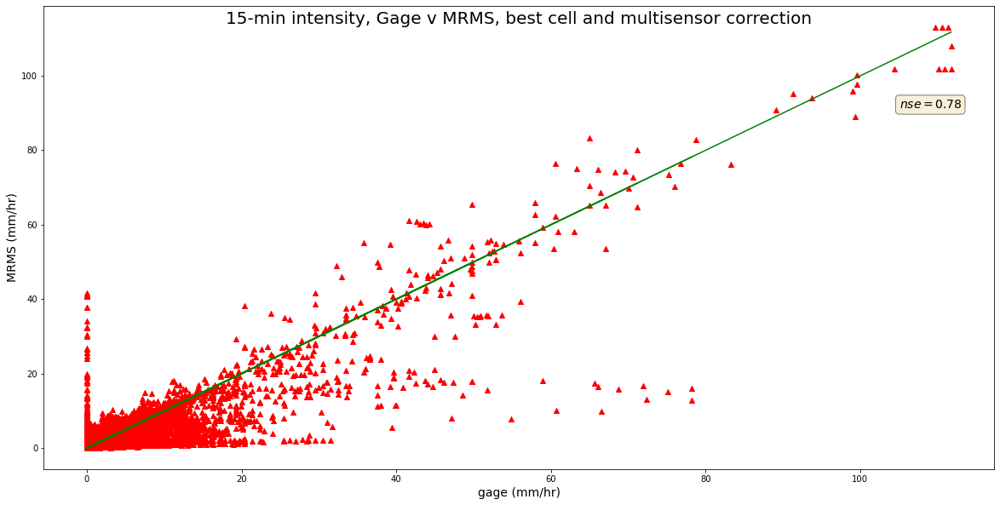

In [5]:
title = '15-min intensity, Gage v MRMS, best cell and multisensor correction'
best_gagevmrms(mrms_15_ATgage,gage_15,title,best_cell_15,gage_id,storm_time)

Time series of gage and best match of closest MRMS neighbors, with multisensor correction

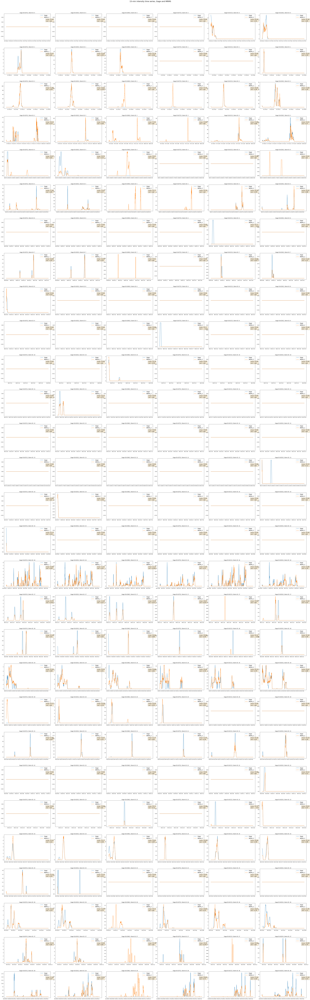

In [6]:
title = '15-min intensity time series, Gage and MRMS'
# intensity
timeseries_int(mrms_15_ATgage,gage_15,title,best_cell_15,gage_id,storm_time)

Time series of gage and multisensor QPE accumulation

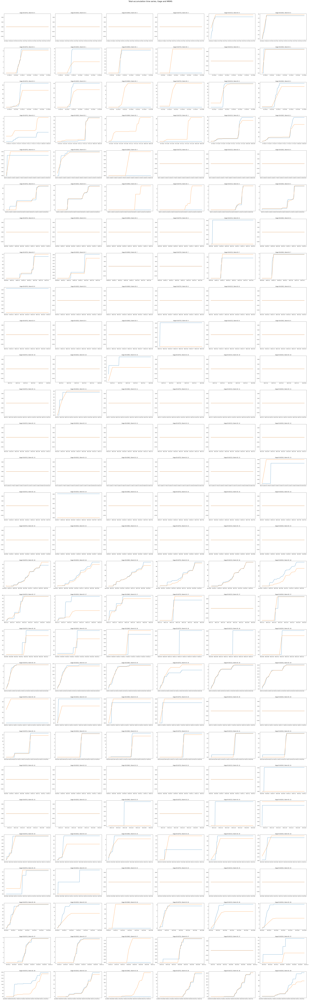

In [7]:
title = 'Total accumulation time series, Gage and MRMS'
# total accumulation
timeseries_accum(mrms_accum_ATgage,gage_accum,title,best_cell_accum,gage_id,storm_time)

Bias for each storm, defined by max intensity or max accumulation of gage vs mrms <br>
If gage value = 0, bias=nan

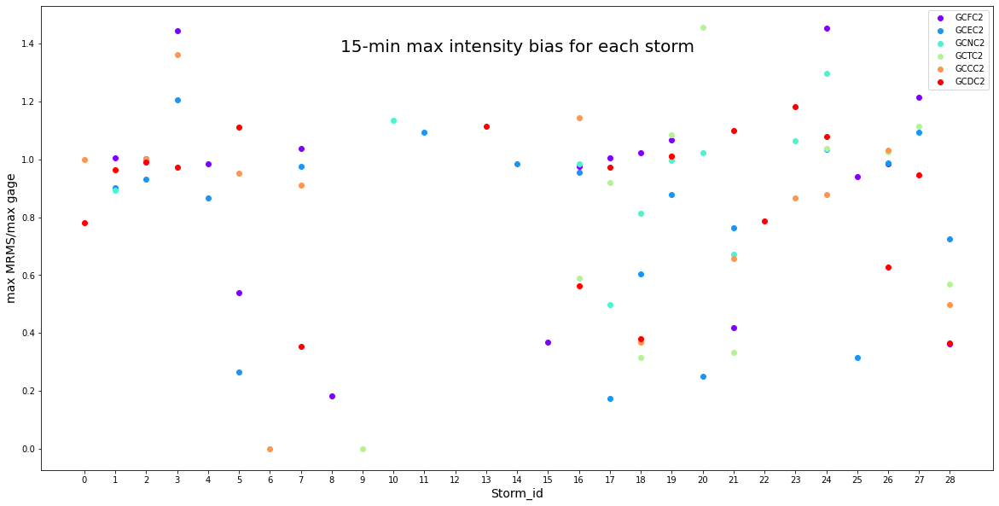

In [8]:
title = '15-min max intensity bias for each storm'
bias_storm(bias_15, title, gage_id, storm_time)

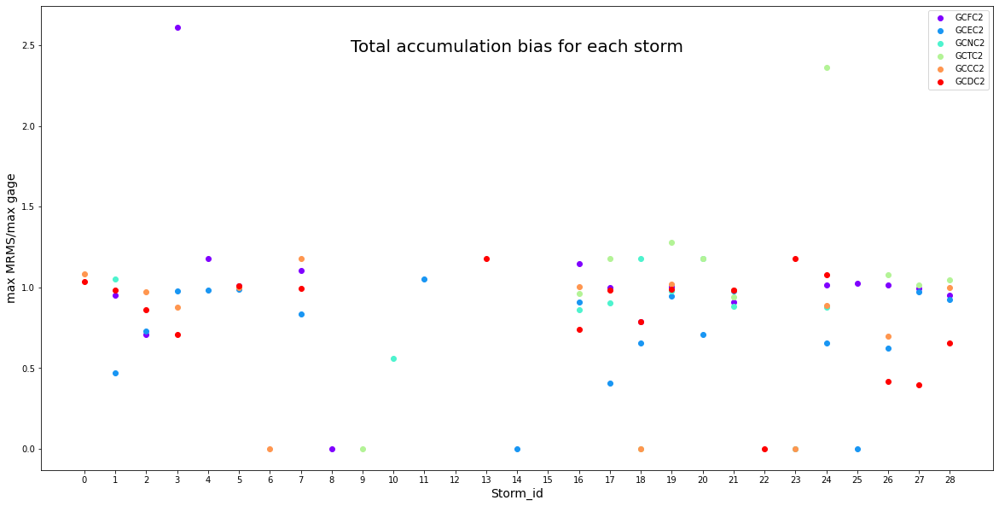

In [9]:
title = 'Total accumulation bias for each storm'
bias_storm(bias_accum, title, gage_id, storm_time)

## How can MRMS be improved?

### Is there a trend in which MRMS coordinate is best?

All values for intensity, separated by coordinate

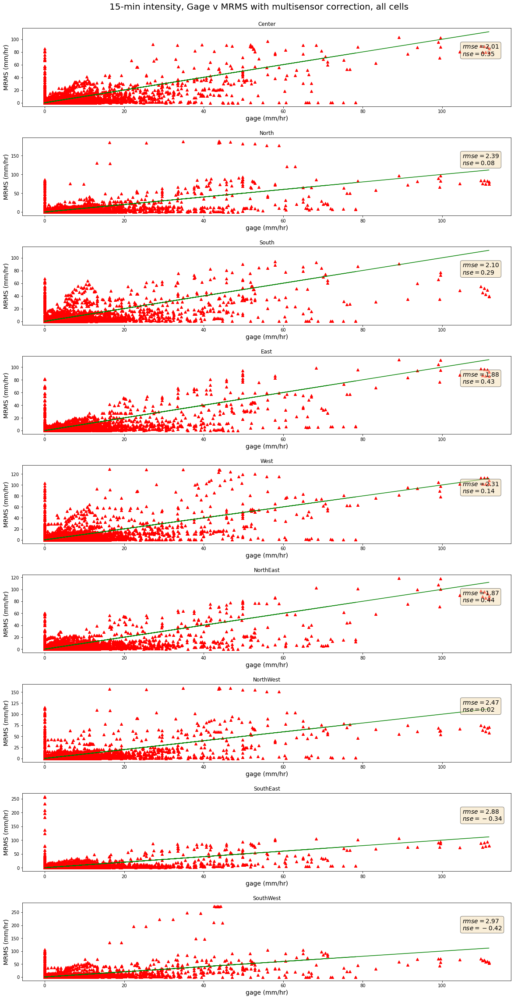

In [10]:
title = '15-min intensity, Gage v MRMS with multisensor correction, all cells'
allcells_gagevmrms(mrms_15_ATgage, gage_15, title, gage_id, storm_time,closest)

Best coordinate by gage <br>
If error is same for multiple cells, values are dropped

C:\Users\GSCOB\OneDrive - Colostate\Desktop\CSU\thesis\USGS\project_main\project_main\code\figure_functions.py:1297: RuntimeWarning: invalid value encountered in divide
  probability = n/len(best_c)


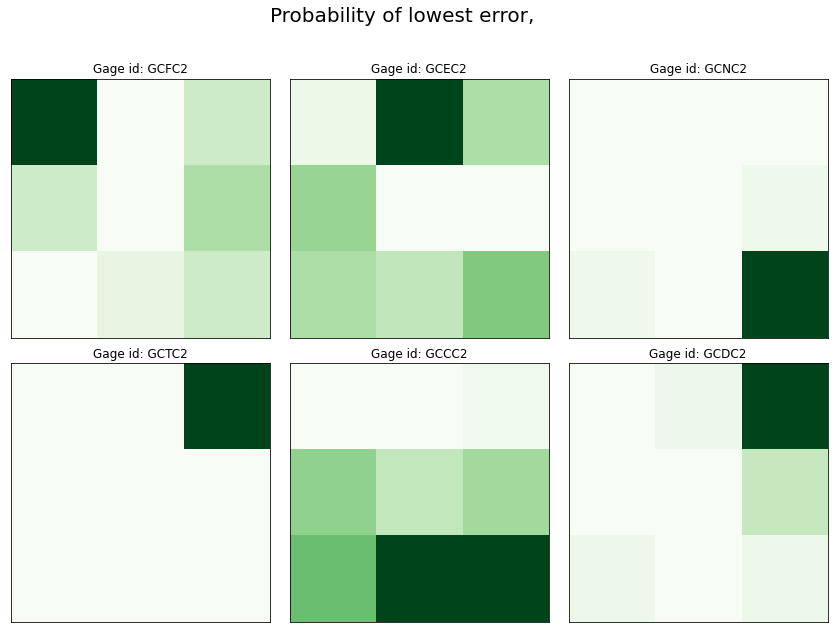

In [11]:
bestcell_bygage(best_cell_15,gage_id,storm_time,closest)

Best coordinate by storm

C:\Users\GSCOB\OneDrive - Colostate\Desktop\CSU\thesis\USGS\project_main\project_main\code\figure_functions.py:466: RuntimeWarning: invalid value encountered in divide
  probability = n/len(best_c)


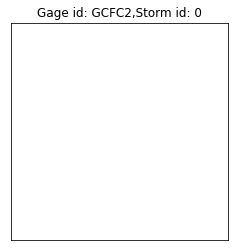

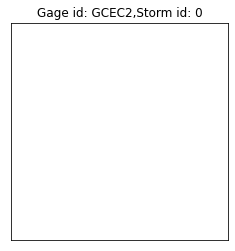

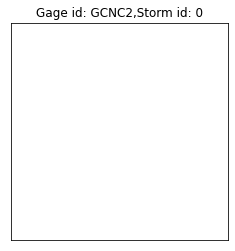

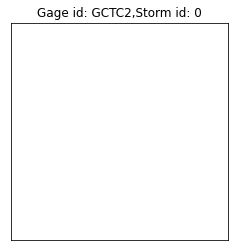

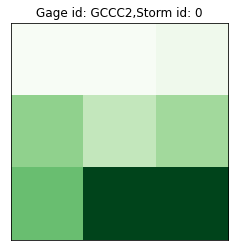

...

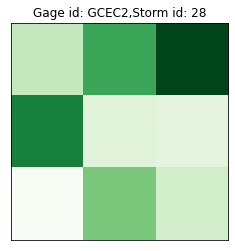

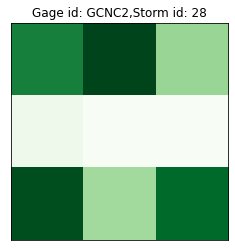

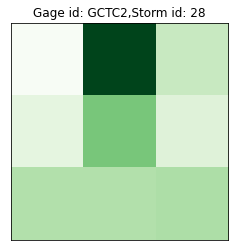

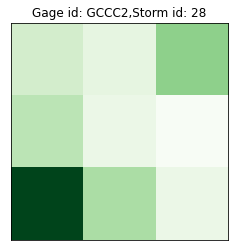

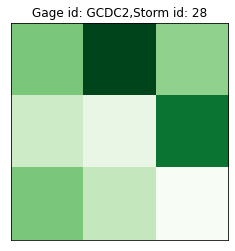

In [12]:
# if blank then multiple cells have same error
bestcell_bystorm(best_cell_15,gage_id,storm_time,closest)

Bias for each cell, by gage

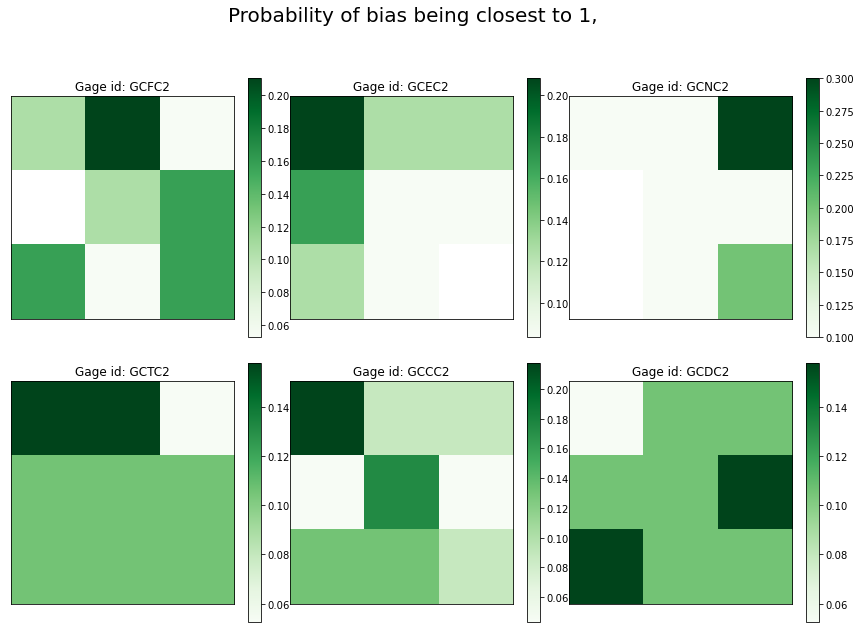

In [13]:
bestcell_bygage_bias(bias_15,gage_id,storm_time)

### How much does multisensor correction improve MRMS QPE?

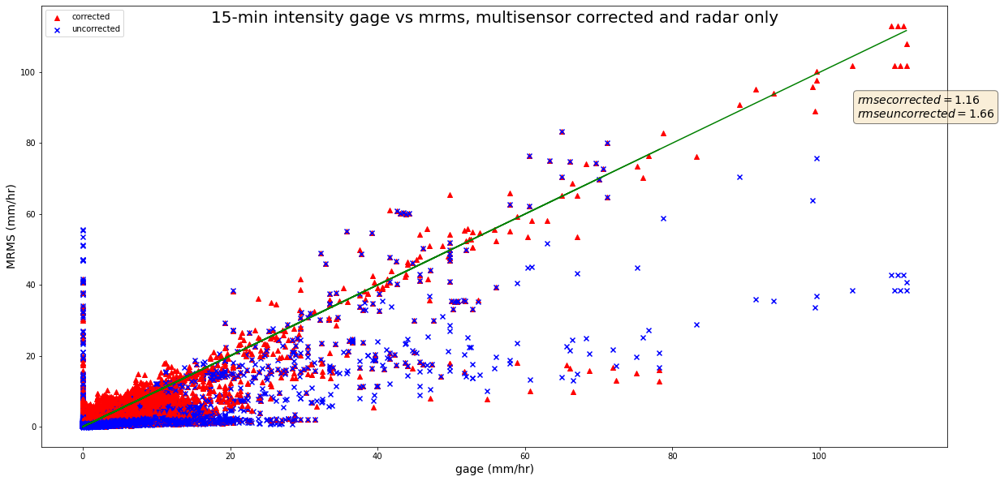

In [14]:
title = '15-min intensity gage vs mrms, multisensor corrected and radar only'
correctedVuncorrected(mrms_15_ATgage,mrms_15_U_ATgage,gage_15,best_cell_15,title, gage_id, storm_time)

Correction vs error <br>
Multisensor multiplicative correction

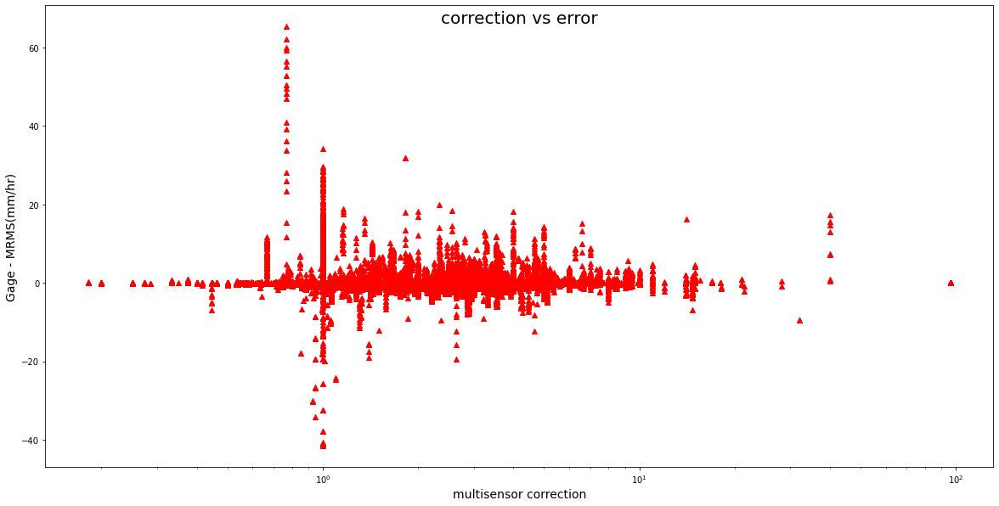

In [15]:
title = 'correction vs error'
best_errorvcorrection(gage_15, mrms_15_ATgage, title, best_cell_15,correction_ATgage,gage_id,storm_time)

gage vs mean,median,max of coordinates

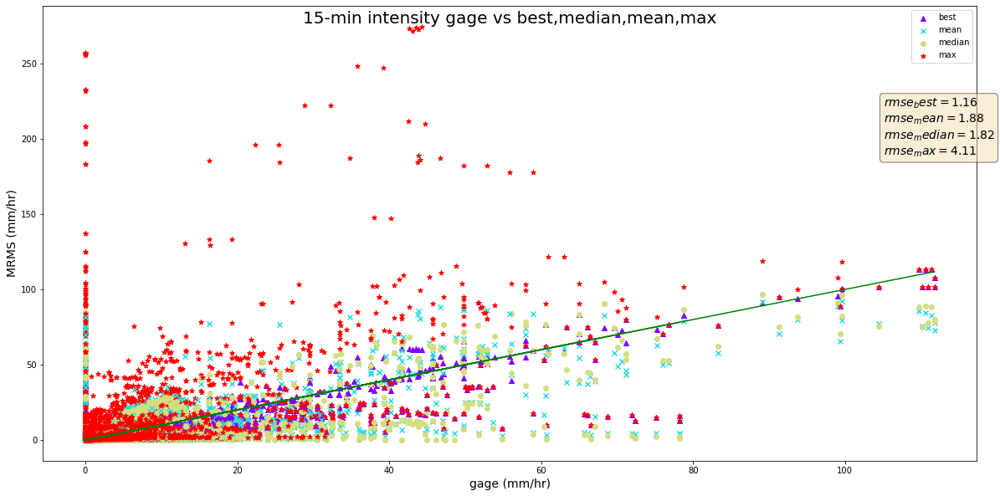

In [16]:
title = '15-min intensity gage vs best,median,mean,max'
group_best(mrms_15_ATgage,gage_15,mean_15,median_15,max_15, best_cell_15,title, gage_id, storm_time)

## Does MRMS do better for particular types of storms?
How fast is storm moving when radar works?(tbd)<br>
How "patchy" is storm when radar works? (tdb)<br>
Topography where radar works (tbd)<br>
Pizza slices, how does radar bin map to cartesian coordinate (tbd)<br>
Intensity<br>
Accumulation<br>

Gage Magnitude vs Error

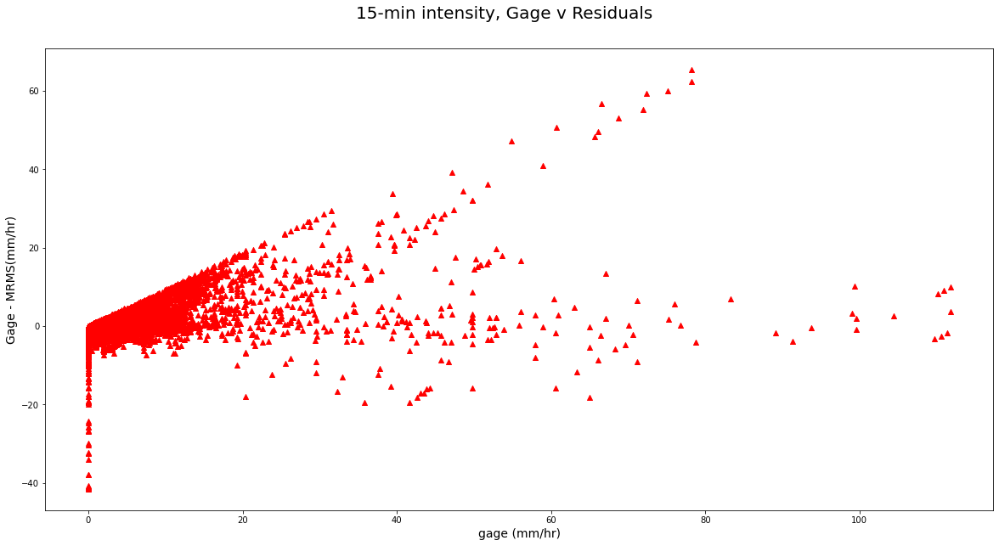

In [17]:
best_gageverror(gage_15,mrms_15_ATgage,best_cell_15,gage_id,storm_time)

Compare gage records to best match of closest MRMS neighbors, by gage and storm

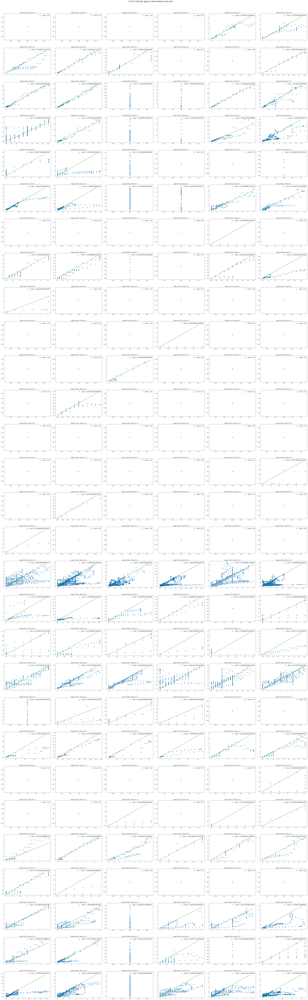

In [18]:
gagevmrms_substorm_subgage(mrms_15_ATgage,gage_15,title,best_cell_15,gage_id,storm_time)

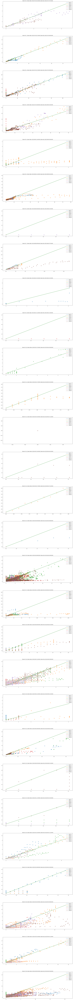

In [19]:
gagevmrms_substorm(mrms_15_ATgage,gage_15,best_cell_15,gage_id,storm_time)


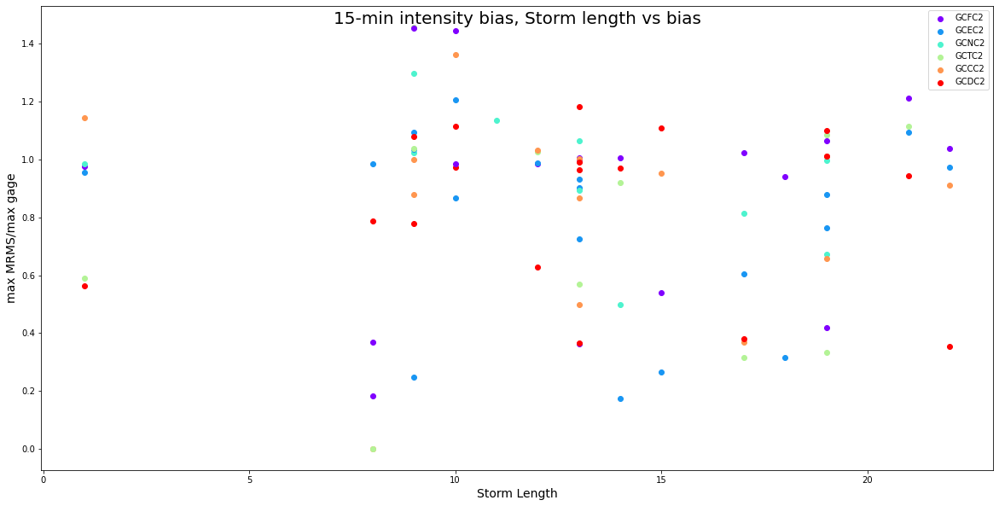

In [20]:
title = '15-min intensity bias, Storm length vs bias'
stormlength_bias(bias_15, title, gage_id, storm_time)

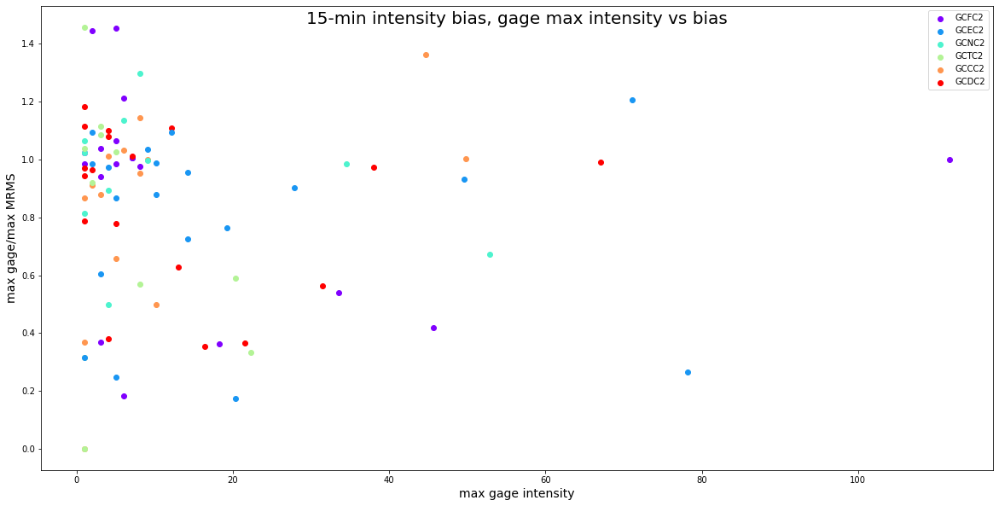

In [21]:
title = '15-min intensity bias, gage max intensity vs bias'
xaxis = 'max gage intensity'
gage_bias(bias_15, gage_15,title, xaxis,gage_id, storm_time)

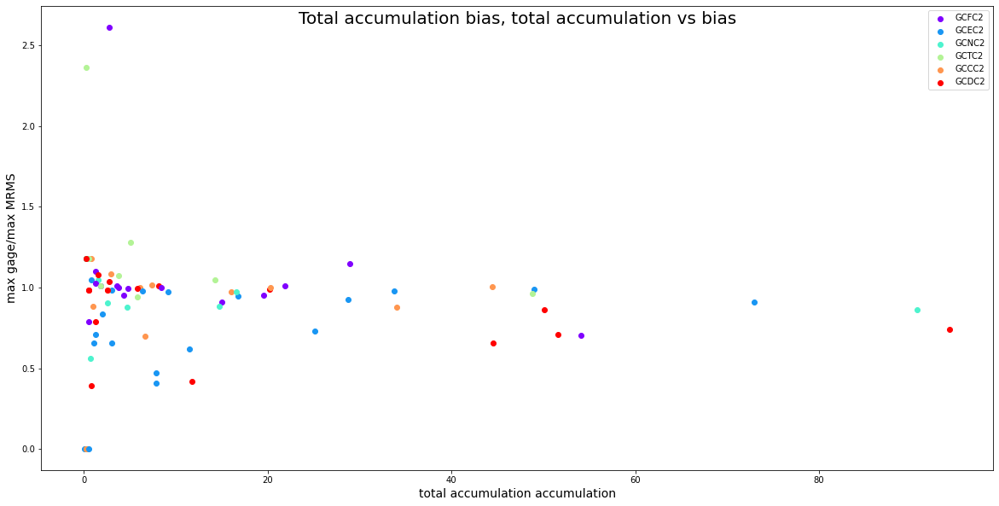

In [22]:
title = 'Total accumulation bias, total accumulation vs bias'
xaxis = 'total accumulation accumulation'
gage_bias(bias_accum, gage_accum,title, xaxis,gage_id, storm_time)

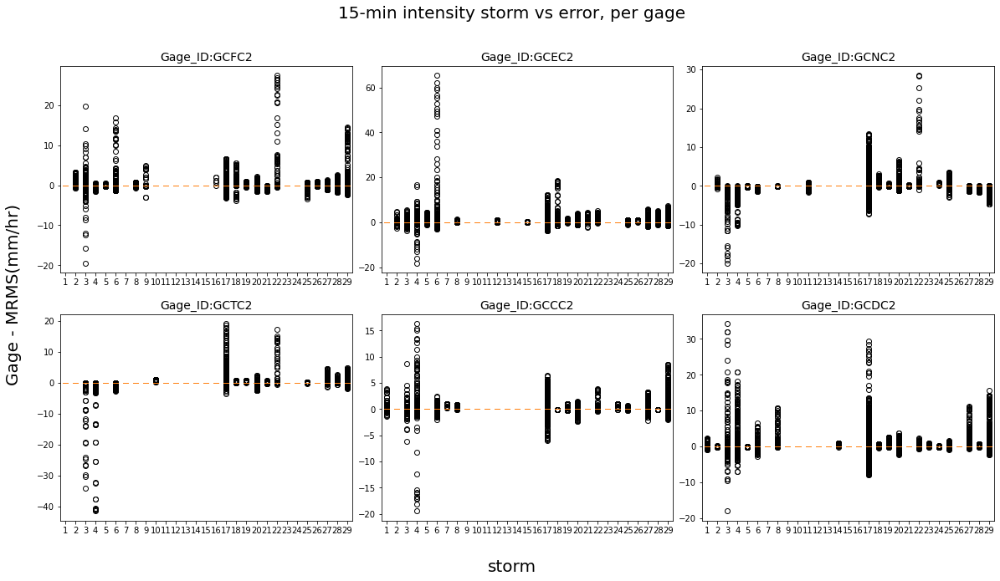

In [23]:
title = '15-min intensity storm vs error, per gage'
boxplots(gage_15,mrms_15_ATgage,best_cell_15, title,gage_id,storm_time)

Animation for each storm including 1hr multisensor QPE

In [ ]:
animation_CO(mrms_QPE_multi_CO,gage_location,closest,storm_time)

Animation size has reached 20992774 bytes, exceeding the limit of 20971520.0. If you're sure you want a larger animation embedded, set the animation.embed_limit rc parameter to a larger value (in MB). This and further frames will be dropped.


In [ ]:
# zoom in
animation_larger(mrms_QPE_multi_CO,gage_location,closest,storm_time)

In [ ]:
# zoom in more
animation_gages(mrms_QPE_multi_CO,gage_location,closest,storm_time)

In [ ]:
# open geotiff and create xarray
datafile1 = "CO_SRTM1arcsec__merge.tif"
codtm = rxr.open_rasterio(datafile1)
# change lon to match global lat/lon in grib file
codtm = codtm.assign_coords(x=(((codtm.x + 360))))

plot_RQI(codtm,RQI)